## **Exploration of Housing in Philadelphia with a focus on Logan Triangle**
#### Author: Olivia Arena

These data explore the current housing conditions in and around the Logan Triangle area of Philadelphia. Data are pulled from Census data via Social Explorer and the Philadelphia Open Data Portal. The two datasets include housing indicators from the ACS 5-Year Estimates (2017-2021) and a dataset of affordable housing projects financed by the Department of Housing and Community Development from 1994-2019. 

#### Data Investigation ####
In conducting my initial visualizations of housing trends, I merge Census data. 

- **First** , I read in the first dataset for the census tracts that make up the Logan Neighborhood (42101028000, 42101028100, 42101028200, 42101028300, 42101028400).

- **Step 2** , I do exploration of the dataset to get a sense of it. 

- **Step 3**, I read in a data from the Philadelphia census tracts with geometries on FIPS codes (downloaded from the Philadelphia Open Data Portal), bringing the geometries together with downloaded housing indicator output.

- **Step 4**, I join these two datasets together on FIPS codes to be able to map data. 

- **Step 5**, I begin to map the data within the Logan Neighborhood on both static and interactive maps to recognize trends and analyze trends in the data.  

- **Step 6**, I repeat all these steps for all the census tracts in Philadelphia to get a sense of how Logan compares with the larger Philadelphia area.  

Next, 

### Set up

As I did in previous weeks, the initial steps in the process of importing and analyzing Census data require the importation of libraries to help spatially visualize the data downloaded from the Census Bureau. The first step in this process is to download pandas and geopandas libraries.

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

We also need to import relevant data pulled from the Census bureau, including a dataset of housing tenure, housing costs, and census block groups from the most recent ACS. For our study area, which does not fit into a pre-identified census geographic designation, I compiled a few census tracts which could make up a study area. The census tracts are 280, 281, 282, 283, 284, and 285 in Philadelphia County, PA. 

In Social Explorer, I chose to run a report pulling in 2017-2021 ACS 5-year data for Census Tracts 280, 281, 282, 283, 284, 285 in Philadelphia County, PA. I selected multiple housing variables including tenure and number of housing units. The command below reads in these data in a csv format into a new dataframe.


In [3]:
df = pd.read_csv('data/R13284958_SL140.csv')

### Data Exploration

After the initial import, several first steps include exploring these data to understand the shape and structure of the dataset.

In [4]:
df.head()

,Geo_FILEID,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_LOGRECNO,Geo_US,Geo_REGION,Geo_DIVISION,Geo_STATECE,Geo_STATE,...,SE_A18001_009,PCT_SE_A18001_002,PCT_SE_A18001_003,PCT_SE_A18001_004,PCT_SE_A18001_005,PCT_SE_A18001_006,PCT_SE_A18001_007,PCT_SE_A18001_008,PCT_SE_A18001_009,SE_A18009_001
0,ACSSF,pa,140,0,9077,NaN,NaN,NaN,NaN,42,...,0,19.43,6.85,6.85,21.34,28.50,11.94,5.10,0,964
1,ACSSF,pa,140,0,9078,NaN,NaN,NaN,NaN,42,...,0,0.00,17.32,8.38,22.16,17.69,6.15,28.31,0,1030
2,ACSSF,pa,140,0,9079,NaN,NaN,NaN,NaN,42,...,0,9.52,7.34,6.53,40.16,16.32,0.00,20.13,0,953
3,ACSSF,pa,140,0,9080,NaN,NaN,NaN,NaN,42,...,0,0.00,7.16,23.68,32.97,9.36,8.89,17.94,0,925
4,ACSSF,pa,140,0,9081,NaN,NaN,NaN,NaN,42,...,0,12.08,23.12,4.73,11.73,21.19,22.07,5.08,0,886


Based on these initial exploratory commands, the dataset includes six rows (the six census tracts) and 218 columns, which likely includes all the specific intervals for each housing variable. For example, for the age of rental stock, the variable includes percentage of renter-occupied housing units built broken down by decade from 2019 to 1939 or earlier. So, there are nine variables that make up that specific indicator.

In [5]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 177 columns):
 #    Column             Non-Null Count  Dtype  
---   ------             --------------  -----  
 0    Geo_FILEID         6 non-null      object 
 1    Geo_STUSAB         6 non-null      object 
 2    Geo_SUMLEV         6 non-null      int64  
 3    Geo_GEOCOMP        6 non-null      int64  
 4    Geo_LOGRECNO       6 non-null      int64  
 5    Geo_US             0 non-null      float64
 6    Geo_REGION         0 non-null      float64
 7    Geo_DIVISION       0 non-null      float64
 8    Geo_STATECE        0 non-null      float64
 9    Geo_STATE          6 non-null      int64  
 10   Geo_COUNTY         6 non-null      int64  
 11   Geo_COUSUB         0 non-null      float64
 12   Geo_PLACE          0 non-null      float64
 13   Geo_TRACT          6 non-null      int64  
 14   Geo_BLKGRP         0 non-null      float64
 15   Geo_CONCIT         0 non-null      float64
 16   Geo_AIANHH

As expected, the number of variables is so high because of the specific increments in which the indicators are broken down. This may become an issue later on, and it might be necessary to subset the data. 

I will need to ensure that the variables for the geographies are read in as strings rather than objects, so I am going to use code to read in the two files that I will use to append to geographic data. The first file, which was initially read in, has housing data for the census tracts that make up the Logan Neighborhood. 

In [6]:
df = pd.read_csv(
    'data/R13284958_SL140.csv',
    dtype=
    {
        'Geo_STATE':str,
        'Geo_COUNTY': str,
        'Geo_TRACT':str, 
        'Geo_FIPS':str
    }
)


The second file has data for the entire Philadelphia County. By comparing the two geographies, I hope to be able to contextualize the housing patterns in the Logan Neighborhood, compared with Philadelphia as a whole. 

In [7]:
dfpa = pd.read_csv(
    'data/R13285245_SL140.csv',
    dtype=
    {
        'Geo_STATE':str,
        'Geo_COUNTY': str,
        'Geo_TRACT':str, 
        'Geo_FIPS':str
    }
)


Now, I want to drop variables that have no data. 

In [8]:
df.columns[df.isna().all()].tolist()


['Geo_US',
 'Geo_REGION',
 'Geo_DIVISION',
 'Geo_STATECE',
 'Geo_COUSUB',
 'Geo_PLACE',
 'Geo_BLKGRP',
 'Geo_CONCIT',
 'Geo_AIANHH',
 'Geo_AIANHHFP',
 'Geo_AIHHTLI',
 'Geo_AITSCE',
 'Geo_AITS',
 'Geo_ANRC',
 'Geo_CBSA',
 'Geo_CSA',
 'Geo_METDIV',
 'Geo_MACC',
 'Geo_MEMI',
 'Geo_NECTA',
 'Geo_CNECTA',
 'Geo_NECTADIV',
 'Geo_UA',
 'Geo_CDCURR',
 'Geo_SLDU',
 'Geo_SLDL',
 'Geo_ZCTA5',
 'Geo_SUBMCD',
 'Geo_SDELM',
 'Geo_SDSEC',
 'Geo_SDUNI',
 'Geo_UR',
 'Geo_PCI',
 'Geo_PUMA5',
 'Geo_BTTR',
 'Geo_BTBG',
 'Geo_PLACESE',
 'Geo_UACP',
 'Geo_VTD',
 'Geo_ZCTA3',
 'Geo_TAZ',
 'Geo_UGA',
 'Geo_PUMA1']

In [9]:
df = df.dropna(axis=1,how="all")

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Columns: 134 entries, Geo_FILEID to SE_A18009_001
dtypes: float64(50), int64(75), object(9)
memory usage: 6.4+ KB


Here it looks like the values dropped from 177 variables to 134. However, I wonder if that is because these were variable categories, like % owner, that just had no data. This issue may be something to come back to. However, for now, I am going to keep all potentially relevant housing indicators including:

* Housing Units
* Households by Household Type
* White vs Non-White Homeowners (owner-occupied units) 
* Occupied housing units by year built 1939 to 2000
* Housing Units (by number and include mobile homes and boats) 
* Average Household Size (Occupied households)

In [11]:
columns_to_keep = ['Geo_FIPS',
                   'SE_A10008_001',
                   'SE_A10008_002',
                   'SE_A10008_003',
                   'SE_A10008_004',
                   'SE_A10008_005',
                   'SE_A10008_006',
                   'SE_A10008_007',
                   'SE_A10008_008',
                   'SE_A10008_009',
                   'SE_A10003_001',
                   'SE_B10060_001',
                   'SE_B10060_002',
                   'SE_B10060_003',
                   'SE_A10036_001',
                   'SE_A18009_001',
                   'SE_A10032_001',
                   'SE_A10032_002',
                   'SE_A10032_003',
                   'SE_A10032_004',
                   'SE_A10032_005',
                   'SE_A10032_006',
                   'SE_A10032_007',
                   'SE_A10032_008',
                   'SE_A10032_009',
                   'SE_A10032_010',
                   'SE_A10032_011',
                   'SE_A10032_012',
                   'SE_A10055_001',
                   'SE_A10055_002',
                   'SE_A10055_003',
                   'SE_A10055_004',
                   'SE_A10055_005',
                   'SE_A10055_006',
                   'SE_A10055_007',
                   'SE_A10055_008',
                   'SE_A10055_009',
                   'SE_A10055_010',
                   'SE_A10055_011',]

In [12]:
df2 = df[columns_to_keep]


Because I just created a new subset of the data and added it to a new dataframe, I want to double check my work. I kept variables related to housing including the categories below: 

* Housing Units
* Households by Household Type
* White vs Non-White Homeowners (owner-occupied units) 
* Occupied housing units by year built 1939 to 2000
* Housing Units (by number and include mobile homes and boats) 
* Average Household Size (Occupied households)

In [14]:
df2.head()

,Geo_FIPS,SE_A10008_001,SE_A10008_002,SE_A10008_003,SE_A10008_004,SE_A10008_005,SE_A10008_006,SE_A10008_007,SE_A10008_008,SE_A10008_009,...,SE_A10055_002,SE_A10055_003,SE_A10055_004,SE_A10055_005,SE_A10055_006,SE_A10055_007,SE_A10055_008,SE_A10055_009,SE_A10055_010,SE_A10055_011
0,42101028000,1735,1016,585,431,71,360,719,466,253,...,0,57,0,15,90,76,88,77,320,1012
1,42101028100,1917,1062,254,808,331,477,855,216,639,...,0,0,87,0,0,81,75,178,130,1366
2,42101028200,2216,1029,486,543,0,543,1187,403,784,...,0,0,37,14,118,112,611,289,259,776
3,42101028300,2532,1248,401,847,5,842,1284,578,706,...,0,0,0,5,0,78,204,736,331,1178
4,42101028400,1363,891,148,743,89,654,472,148,324,...,0,0,0,0,11,72,79,205,371,625


In [15]:
df2.columns = ['FIPS',
                   'Households',
                   'Family Households',
                   'Married-Couple Family',
                   'Other Family',
                   'Male Householder, No Wife Present',
                   'Female Householder, No Husband Present',
                   'Nonfamily Households',
                   'Male Householder',
                   'Female Householder',
                   'Average Household Size of Occupied Housing Units',
                   'Owner Occupied Housing Units',
                   'White Alone, Not Hispanic or Latino Homeowners of Owner Occupied Housing Units',
                   'Non-White Homeowners of Owner Occupied Housing Units',
                   'Median House Value for All Owner-Occupied Housing Units',
                   'Median Gross Rent in Renter-occupied housing units paying cash rent',
                   'Housing Units',
                   '1 Unit',
                   '1 Unit, Detached',
                   '1 Unit, Attached',
                   '2 Units',
                   '3 or 4 Units',
                   '5 to 9 Units',
                   '10 to 19 Units',
                   '20 to 49 Units',
                   '50 or More Units',
                   'Mobile Home',
                   'Boat, Rv, Van, Etc.',
                   'Occupied Housing Units',
                   'Occupied Housing Units: Built 2020 or Later',
                   'Occupied Housing Units: Built 2010 to 2019',
                   'Occupied Housing Units: Built 2000 to 2009',
                   'Occupied Housing Units: Built 1990 to 1999',
                   'Occupied Housing Units: Built 1980 to 1989',
                   'Occupied Housing Units: Built 1970 to 1979',
                   'Occupied Housing Units: Built 1960 to 1969',
                   'Occupied Housing Units: Built 1950 to 1959',
                   'Occupied Housing Units: Built 1940 to 1949',
                   'Occupied Housing Units: Built 1939 or Earlier',]

In [16]:
columns = list(df2)
columns

['FIPS',
 'Households',
 'Family Households',
 'Married-Couple Family',
 'Other Family',
 'Male Householder, No Wife Present',
 'Female Householder, No Husband Present',
 'Nonfamily Households',
 'Male Householder',
 'Female Householder',
 'Average Household Size of Occupied Housing Units',
 'Owner Occupied Housing Units',
 'White Alone, Not Hispanic or Latino Homeowners of Owner Occupied Housing Units',
 'Non-White Homeowners of Owner Occupied Housing Units',
 'Median House Value for All Owner-Occupied Housing Units',
 'Median Gross Rent in Renter-occupied housing units paying cash rent',
 'Housing Units',
 '1 Unit',
 '1 Unit, Detached',
 '1 Unit, Attached',
 '2 Units',
 '3 or 4 Units',
 '5 to 9 Units',
 '10 to 19 Units',
 '20 to 49 Units',
 '50 or More Units',
 'Mobile Home',
 'Boat, Rv, Van, Etc.',
 'Occupied Housing Units',
 'Occupied Housing Units: Built 2020 or Later',
 'Occupied Housing Units: Built 2010 to 2019',
 'Occupied Housing Units: Built 2000 to 2009',
 'Occupied Housing

Now, I want to take a look to make sure these variable names were added to the columns wihtout error.

In [19]:
df2.sample(5)

,FIPS,Households,Family Households,Married-Couple Family,Other Family,"Male Householder, No Wife Present","Female Householder, No Husband Present",Nonfamily Households,Male Householder,Female Householder,...,Occupied Housing Units: Built 2020 or Later,Occupied Housing Units: Built 2010 to 2019,Occupied Housing Units: Built 2000 to 2009,Occupied Housing Units: Built 1990 to 1999,Occupied Housing Units: Built 1980 to 1989,Occupied Housing Units: Built 1970 to 1979,Occupied Housing Units: Built 1960 to 1969,Occupied Housing Units: Built 1950 to 1959,Occupied Housing Units: Built 1940 to 1949,Occupied Housing Units: Built 1939 or Earlier
4,42101028400,1363,891,148,743,89,654,472,148,324,...,0,0,0,0,11,72,79,205,371,625
2,42101028200,2216,1029,486,543,0,543,1187,403,784,...,0,0,37,14,118,112,611,289,259,776
3,42101028300,2532,1248,401,847,5,842,1284,578,706,...,0,0,0,5,0,78,204,736,331,1178
1,42101028100,1917,1062,254,808,331,477,855,216,639,...,0,0,87,0,0,81,75,178,130,1366
0,42101028000,1735,1016,585,431,71,360,719,466,253,...,0,57,0,15,90,76,88,77,320,1012


The next step now that the data has been read in and cleaned is to begin exploring trends in the data. 

In [114]:
tracts_tenure['PCT_Renter'] =df2['Renter Occupied']/df2['Occupied Housing Units']*100
tracts_tenure['PCT_Owner'] = df2['Owner Occupied']/df2['Occupied Housing Units']*100

KeyError: 'Renter Occupied'

### Importing geographic data for mapping

Now, I will import the geographic data to be able to map the Census data on specific rtacts and visualize some of the patterns within Philadelphia. 

In [22]:
import geopandas as gpd
import matplotlib.pyplot as plt

I found a geojson file with Philadelphia Census Tracts from 2010 on the Philadelphia Open Data Portal. I am reading in the file for all of Philadelphia. Depending on the ACS dataset, I will either subset specific tracts or I will use all of the tracks in Philadelphia for comparison. 

In [23]:
tracts=gpd.read_file('data/Census_Tracts_2010.geojson')
tracts.head()

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,GEOID10,NAME10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,LOGRECNO,geometry
0,1,42,101,009400,42101009400,94,Census Tract 94,G5020,S,366717,0,+39.9632709,-075.2322437,10429,"POLYGON ((-75.22927 39.96054, -75.22865 39.960..."
1,2,42,101,009500,42101009500,95,Census Tract 95,G5020,S,319070,0,+39.9658709,-075.2379140,10430,"POLYGON ((-75.23536 39.96852, -75.23545 39.969..."
2,3,42,101,009600,42101009600,96,Census Tract 96,G5020,S,405273,0,+39.9655396,-075.2435075,10431,"POLYGON ((-75.24343 39.96230, -75.24339 39.962..."
3,4,42,101,013800,42101013800,138,Census Tract 138,G5020,S,341256,0,+39.9764504,-075.1771771,10468,"POLYGON ((-75.17341 39.97779, -75.17386 39.977..."
4,5,42,101,013900,42101013900,139,Census Tract 139,G5020,S,562934,0,+39.9750563,-075.1711846,10469,"POLYGON ((-75.17313 39.97776, -75.17321 39.977..."


Now that the geometric data has been imported, I will run an initial plot to begin visualizing. Now, I want to subset this dataset to only include the two variables that I need to use for mapping, which are the FIPS code (for joining) and the geometry (for spatial visualizing). I am dropping all variables except for the tract variable (TRACTCE10) and the geometry variable.   

In [24]:
tracts = tracts[['TRACTCE10','geometry']]
tracts.head()

,TRACTCE10,geometry
0,009400,"POLYGON ((-75.22927 39.96054, -75.22865 39.960..."
1,009500,"POLYGON ((-75.23536 39.96852, -75.23545 39.969..."
2,009600,"POLYGON ((-75.24343 39.96230, -75.24339 39.962..."
3,013800,"POLYGON ((-75.17341 39.97779, -75.17386 39.977..."
4,013900,"POLYGON ((-75.17313 39.97776, -75.17321 39.977..."


As explained above, to get the full FIPS code for the tract, I will need the state and city codes for Philadelphia. Then, I will merge these codes to the specific tract codes. 

In [25]:
tracts['FIPS'] ='42' + '101' + tracts['TRACTCE10']


I wanted to make sure that the new variable was created, so I printed and below I tried it the way it is written in the lab notes.

In [26]:
df2.head()

,FIPS,Households,Family Households,Married-Couple Family,Other Family,"Male Householder, No Wife Present","Female Householder, No Husband Present",Nonfamily Households,Male Householder,Female Householder,...,Occupied Housing Units: Built 2020 or Later,Occupied Housing Units: Built 2010 to 2019,Occupied Housing Units: Built 2000 to 2009,Occupied Housing Units: Built 1990 to 1999,Occupied Housing Units: Built 1980 to 1989,Occupied Housing Units: Built 1970 to 1979,Occupied Housing Units: Built 1960 to 1969,Occupied Housing Units: Built 1950 to 1959,Occupied Housing Units: Built 1940 to 1949,Occupied Housing Units: Built 1939 or Earlier
0,42101028000,1735,1016,585,431,71,360,719,466,253,...,0,57,0,15,90,76,88,77,320,1012
1,42101028100,1917,1062,254,808,331,477,855,216,639,...,0,0,87,0,0,81,75,178,130,1366
2,42101028200,2216,1029,486,543,0,543,1187,403,784,...,0,0,37,14,118,112,611,289,259,776
3,42101028300,2532,1248,401,847,5,842,1284,578,706,...,0,0,0,5,0,78,204,736,331,1178
4,42101028400,1363,891,148,743,89,654,472,148,324,...,0,0,0,0,11,72,79,205,371,625


### Housing Data

The first thing I am looking at will be the values of the housing stock and costs to rent in the Logan Neighbothood compared with tracts across Philadelphia. I think this will help further contextualize the housing situation. Having imported the geographic data and created the FIPS variable that will enable me to merge the two files, it is time to merge. I merge the file with geometry to the file of ACS with housing data into a new file "tracts_housing."

In [49]:
tracts_housing= tracts.merge(df2,on='FIPS')
#tracts_tenure = df2.merge(tracts,on='FIPS')

Now I want to see how the merge worked! 

In [50]:
tracts_housing.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6 entries, 0 to 5
Data columns (total 41 columns):
 #   Column                                                                          Non-Null Count  Dtype   
---  ------                                                                          --------------  -----   
 0   TRACTCE10                                                                       6 non-null      object  
 1   geometry                                                                        6 non-null      geometry
 2   FIPS                                                                            6 non-null      object  
 3   Households                                                                      6 non-null      int64   
 4   Family Households                                                               6 non-null      int64   
 5   Married-Couple Family                                                           6 non-null      int64   
 6   Other 

## Comparison to Philadelphia-County

Now, I am going to try to map some of these same variables at the Philadelphia County level because Philadelphia has the same borders as Philadelphia County, and the dataset pulled from the City's database is at the County-level. I am going to run the same code that I did for the specific tracts and make comparisons.

In [54]:
dfpa.columns[dfpa.isna().all()].tolist()


[]

In [55]:
dfpa = dfpa.dropna(axis=1,how="all")

After an initial look at the columns and a drop of the variables that are empty, I am going to just keep the FIPS and the tenure data.

In [56]:
columns_to_keep_pa = ['Geo_FIPS',
                   'SE_A10008_001',
                   'SE_A10008_002',
                   'SE_A10008_003',
                   'SE_A10008_004',
                   'SE_A10008_005',
                   'SE_A10008_006',
                   'SE_A10008_007',
                   'SE_A10008_008',
                   'SE_A10008_009',
                   'SE_A10003_001',
                   'SE_B10060_001',
                   'SE_B10060_002',
                   'SE_B10060_003',
                   'SE_A10036_001',
                   'SE_A18009_001',
                   'SE_A10032_001',
                   'SE_A10032_002',
                   'SE_A10032_003',
                   'SE_A10032_004',
                   'SE_A10032_005',
                   'SE_A10032_006',
                   'SE_A10032_007',
                   'SE_A10032_008',
                   'SE_A10032_009',
                   'SE_A10032_010',
                   'SE_A10032_011',
                   'SE_A10032_012',
                   'SE_A10055_001',
                   'SE_A10055_002',
                   'SE_A10055_003',
                   'SE_A10055_004',
                   'SE_A10055_005',
                   'SE_A10055_006',
                   'SE_A10055_007',
                   'SE_A10055_008',
                   'SE_A10055_009',
                   'SE_A10055_010',
                   'SE_A10055_011',]

In [57]:
df2pa = dfpa[columns_to_keep_pa]


In [58]:
columns = list(df2pa)
columns

['Geo_FIPS',
 'SE_A10008_001',
 'SE_A10008_002',
 'SE_A10008_003',
 'SE_A10008_004',
 'SE_A10008_005',
 'SE_A10008_006',
 'SE_A10008_007',
 'SE_A10008_008',
 'SE_A10008_009',
 'SE_A10003_001',
 'SE_B10060_001',
 'SE_B10060_002',
 'SE_B10060_003',
 'SE_A10036_001',
 'SE_A18009_001',
 'SE_A10032_001',
 'SE_A10032_002',
 'SE_A10032_003',
 'SE_A10032_004',
 'SE_A10032_005',
 'SE_A10032_006',
 'SE_A10032_007',
 'SE_A10032_008',
 'SE_A10032_009',
 'SE_A10032_010',
 'SE_A10032_011',
 'SE_A10032_012',
 'SE_A10055_001',
 'SE_A10055_002',
 'SE_A10055_003',
 'SE_A10055_004',
 'SE_A10055_005',
 'SE_A10055_006',
 'SE_A10055_007',
 'SE_A10055_008',
 'SE_A10055_009',
 'SE_A10055_010',
 'SE_A10055_011']

I will also rename the columns to more clearly show the content of the variables.

In [59]:
df2pa.columns = ['FIPS',
                   'Households',
                   'Family Households',
                   'Married-Couple Family',
                   'Other Family',
                   'Male Householder, No Wife Present',
                   'Female Householder, No Husband Present',
                   'Nonfamily Households',
                   'Male Householder',
                   'Female Householder',
                   'Average Household Size of Occupied Housing Units',
                   'Owner Occupied Housing Units',
                   'White Alone, Not Hispanic or Latino Homeowners of Owner Occupied Housing Units',
                   'Non-White Homeowners of Owner Occupied Housing Units',
                   'Median House Value for All Owner-Occupied Housing Units',
                   'Median Gross Rent in Renter-occupied housing units paying cash rent',
                   'Housing Units',
                   '1 Unit',
                   '1 Unit, Detached',
                   '1 Unit, Attached',
                   '2 Units',
                   '3 or 4 Units',
                   '5 to 9 Units',
                   '10 to 19 Units',
                   '20 to 49 Units',
                   '50 or More Units',
                   'Mobile Home',
                   'Boat, Rv, Van, Etc.',
                   'Occupied Housing Units',
                   'Occupied Housing Units: Built 2020 or Later',
                   'Occupied Housing Units: Built 2010 to 2019',
                   'Occupied Housing Units: Built 2000 to 2009',
                   'Occupied Housing Units: Built 1990 to 1999',
                   'Occupied Housing Units: Built 1980 to 1989',
                   'Occupied Housing Units: Built 1970 to 1979',
                   'Occupied Housing Units: Built 1960 to 1969',
                   'Occupied Housing Units: Built 1950 to 1959',
                   'Occupied Housing Units: Built 1940 to 1949',
                   'Occupied Housing Units: Built 1939 or Earlier',]

In [60]:
df2pa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 408 entries, 0 to 407
Data columns (total 39 columns):
 #   Column                                                                          Non-Null Count  Dtype  
---  ------                                                                          --------------  -----  
 0   FIPS                                                                            408 non-null    object 
 1   Households                                                                      408 non-null    int64  
 2   Family Households                                                               408 non-null    int64  
 3   Married-Couple Family                                                           408 non-null    int64  
 4   Other Family                                                                    408 non-null    int64  
 5   Male Householder, No Wife Present                                               408 non-null    int64  
 6   Female Householder

Similar to above, I am going to merge the two datasets based on the common variable -- 'FIPS'. 

In [61]:
pa_housing= tracts.merge(df2pa,on='FIPS')


Now, just to confirm, I am going to look at the data!

In [63]:
pa_housing.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 363 entries, 0 to 362
Data columns (total 41 columns):
 #   Column                                                                          Non-Null Count  Dtype   
---  ------                                                                          --------------  -----   
 0   TRACTCE10                                                                       363 non-null    object  
 1   geometry                                                                        363 non-null    geometry
 2   FIPS                                                                            363 non-null    object  
 3   Households                                                                      363 non-null    int64   
 4   Family Households                                                               363 non-null    int64   
 5   Married-Couple Family                                                           363 non-null    int64   
 6   Ot

### Economics of Housing Values and Rental Costs

Now that I have had a chance to get a sense of the data both at the tract-level and at the city-level, I want to make some pretty maps specifically around the economics of housing costs. Based on background reading of Logan, I know that it is more owner-occupied than other parts of Philadelphia because of the long-term tenancy but also lower cost of housing. I will now look at the house value for owner-occupied housing units and gross rent for rented units. 

I also want to make it pretty, so I am going to change the color-scheme to be a more muted palette. I am also going to create a horizontal legend and remove the axes to make the map cleaner. To do this, I need to import mapping libraries to plot. 

In [64]:
import matplotlib.pyplot as plt
%matplotlib inline

In [65]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [66]:
tracts_housing['Median House Value for All Owner-Occupied Housing Units'].describe()

count         6.000000
mean      96616.666667
std       15847.702252
min       76400.000000
25%       83875.000000
50%       98600.000000
75%      108450.000000
max      115400.000000
Name: Median House Value for All Owner-Occupied Housing Units, dtype: float64

In the six Logan tracts, the average home value of owner-occupied homes is $96,617 and the range is $76,400 to $115,400.

In [67]:
pa_housing['Median House Value for All Owner-Occupied Housing Units'].describe()

count       347.000000
mean     219936.887608
std      151300.112205
min       44500.000000
25%      109350.000000
50%      177000.000000
75%      273150.000000
max      984800.000000
Name: Median House Value for All Owner-Occupied Housing Units, dtype: float64

Compared with the Philadelphia figures, the home value is much lower. Across all tracts in Philadelphia, the mean value of an owner-occupied house is 219,937 over double the value of a home in the Logan neighborhood. Granted, the range in home values is much larger across Philadelphia, the tract with the lowest mean home value for an owner-occupied had a value of 44,500, while the highest average value of a tract was 984,800. 

Now, I plan to look at this spatial distribution. 

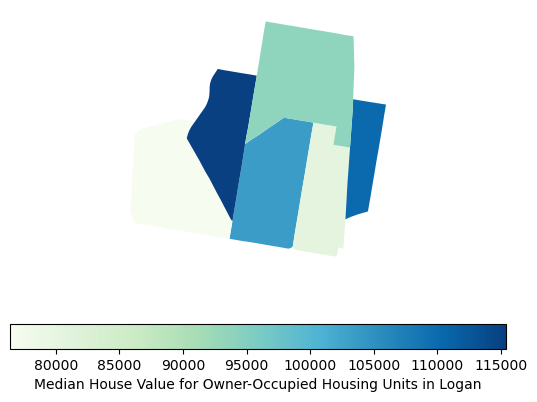

In [68]:
ax1 =tracts_housing.plot(column='Median House Value for All Owner-Occupied Housing Units',
                   legend=True,
  legend_kwds={'label': "Median House Value for Owner-Occupied Housing Units in Logan",
                        'orientation': "horizontal"},
               cmap='GnBu');

ax1.set_axis_off()
plt.savefig("logan home value map.pdf", transparent=True)


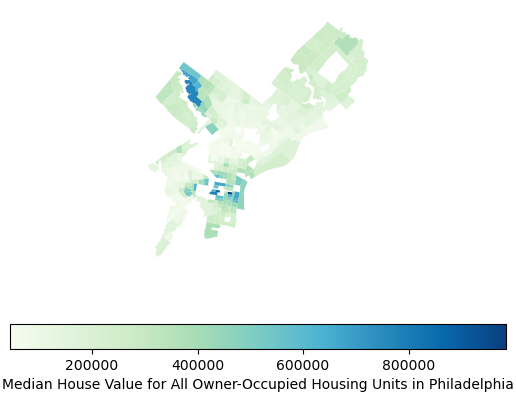

In [69]:
ax2 = pa_housing.plot(column='Median House Value for All Owner-Occupied Housing Units',
                   legend=True,
  legend_kwds={'label': "Median House Value for All Owner-Occupied Housing Units in Philadelphia",
                        'orientation': "horizontal"},
               cmap='GnBu');
ax2.set_axis_off()

plt.savefig("philadelphia home value map.pdf", transparent=True)

It looks like the tracts with the higher percentage of renters, still have (relative to the other census tracts in the neighborhood) okay home value. Across Philadelphia, the areas with the highest averages are in the northwest along the river and in the southeast part of downtown. I want to explore this theory a little more and look at the interactive folium map. 

In [70]:
tracts_housing.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6 entries, 0 to 5
Data columns (total 41 columns):
 #   Column                                                                          Non-Null Count  Dtype   
---  ------                                                                          --------------  -----   
 0   TRACTCE10                                                                       6 non-null      object  
 1   geometry                                                                        6 non-null      geometry
 2   FIPS                                                                            6 non-null      object  
 3   Households                                                                      6 non-null      int64   
 4   Family Households                                                               6 non-null      int64   
 5   Married-Couple Family                                                           6 non-null      int64   
 6   Other 

In [71]:
tracts = ["42101028000", "42101028100", "42101028200", "42101028300", "42101028400", "42101028500"]

In [72]:
logan_geo = pa_housing[pa_housing["FIPS"].isin(["42101028000", "42101028100", "42101028200", "42101028300", "42101028400", "42101028500"])]

In [73]:
logan_geo.describe()

,Households,Family Households,Married-Couple Family,Other Family,"Male Householder, No Wife Present","Female Householder, No Husband Present",Nonfamily Households,Male Householder,Female Householder,Average Household Size of Occupied Housing Units,...,Occupied Housing Units: Built 2020 or Later,Occupied Housing Units: Built 2010 to 2019,Occupied Housing Units: Built 2000 to 2009,Occupied Housing Units: Built 1990 to 1999,Occupied Housing Units: Built 1980 to 1989,Occupied Housing Units: Built 1970 to 1979,Occupied Housing Units: Built 1960 to 1969,Occupied Housing Units: Built 1950 to 1959,Occupied Housing Units: Built 1940 to 1949,Occupied Housing Units: Built 1939 or Earlier
count,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.00000,6.000000,6.000000,6.000000,...,6.0,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000
mean,1813.166667,943.666667,328.500000,615.166667,96.833333,518.333333,869.50000,326.500000,543.000000,2.445000,...,0.0,9.500000,20.666667,15.333333,46.500000,73.000000,189.833333,264.666667,260.333333,933.333333
std,526.227866,282.963366,193.689184,216.385227,121.254141,215.126629,310.55225,181.383296,212.606679,0.230456,...,0.0,23.270153,35.708076,21.905859,50.540083,30.119761,212.155996,242.970506,99.743003,302.445808
min,1116.000000,416.000000,97.000000,319.000000,0.000000,234.000000,472.00000,148.000000,253.000000,2.150000,...,0.0,0.000000,0.000000,0.000000,0.000000,19.000000,75.000000,77.000000,130.000000,625.000000
25%,1456.000000,922.250000,174.500000,459.000000,21.500000,389.250000,704.75000,165.000000,381.000000,2.277500,...,0.0,0.000000,0.000000,1.250000,2.750000,73.000000,79.750000,121.750000,178.000000,676.250000
50%,1826.000000,1022.500000,327.500000,643.000000,78.000000,510.000000,787.00000,309.500000,595.500000,2.460000,...,0.0,0.000000,0.000000,9.500000,35.500000,77.000000,85.000000,191.500000,289.500000,894.000000
75%,2141.250000,1053.750000,464.750000,791.750000,88.000000,626.250000,1104.00000,450.250000,689.250000,2.590000,...,0.0,0.000000,27.750000,14.750000,82.500000,80.250000,175.000000,268.000000,328.250000,1136.500000
max,2532.000000,1248.000000,585.000000,847.000000,331.000000,842.000000,1284.00000,578.000000,784.000000,2.750000,...,0.0,57.000000,87.000000,58.000000,118.000000,112.000000,611.000000,736.000000,371.000000,1366.000000


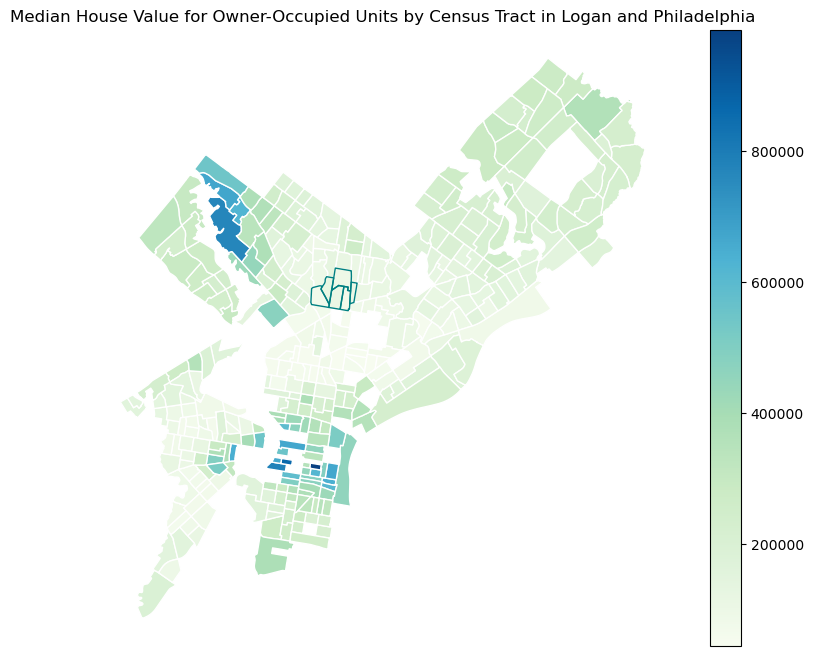

In [140]:
fig, ax = plt.subplots(figsize = (10,8)) 
pa_housing.plot(column = 'Median House Value for All Owner-Occupied Housing Units',legend=True,
  legend_kwds={'orientation': "vertical"},edgecolor='white',cmap = 'GnBu',ax=ax)
logan_geo.geometry.boundary.plot(color=None,edgecolor='teal',linewidth = 1,ax=ax)
ax.axis('off')
plt.title('Median House Value for Owner-Occupied Units by Census Tract in Logan and Philadelphia')

plt.savefig("logan and pa home value map.pdf", transparent=True)

In [135]:
tracts_housing['Median House Value for All Owner-Occupied Housing Units'].describe()

count         6.000000
mean      96616.666667
std       15847.702252
min       76400.000000
25%       83875.000000
50%       98600.000000
75%      108450.000000
max      115400.000000
Name: Median House Value for All Owner-Occupied Housing Units, dtype: float64

In [195]:
pa_housing['Median House Value for All Owner-Occupied Housing Units'].describe()

count       347.000000
mean     219936.887608
std      151300.112205
min       44500.000000
25%      109350.000000
50%      177000.000000
75%      273150.000000
max      984800.000000
Name: Median House Value for All Owner-Occupied Housing Units, dtype: float64

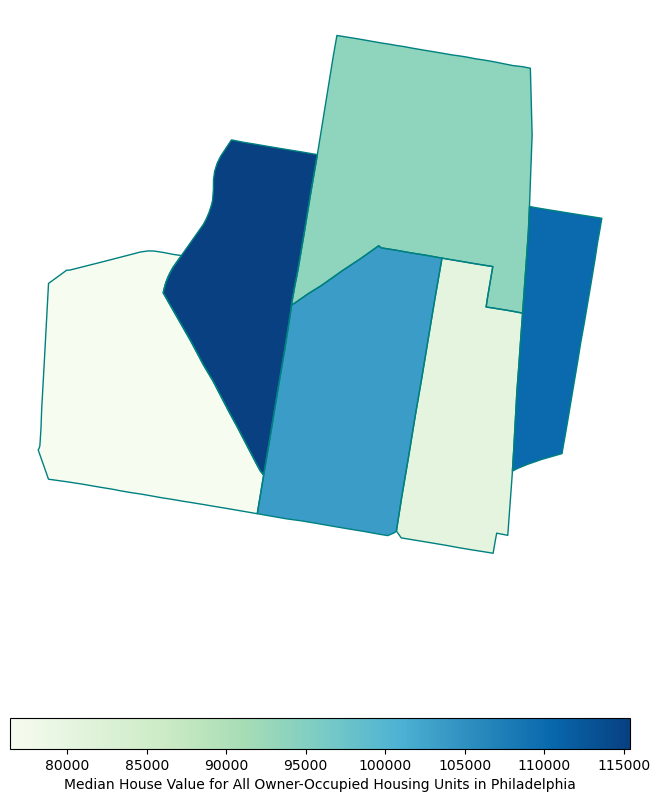

In [66]:
fig, ax = plt.subplots(figsize = (8,12)) 
logan_geo.plot(column = 'Median House Value for All Owner-Occupied Housing Units',legend=True,
  legend_kwds={'label': "Median House Value for All Owner-Occupied Housing Units in Philadelphia",
                        'orientation': "horizontal"},cmap = 'GnBu',ax=ax)
logan_geo.geometry.boundary.plot(color=None,edgecolor='teal',linewidth = 1,ax=ax)
ax.axis('off')


plt.savefig("logan and pa home value map.pdf", transparent=True)

In [77]:
m = folium.Map(location=[+40.02, -75.14], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')

folium.Choropleth(
                  geo_data=pa_housing, # geo data
                  data=pa_housing, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Median House Value for All Owner-Occupied Housing Units'], # [key, value]
                  fill_color='GnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Home Values in Philadelphia (2021)').add_to(m)    # name on the legend color bar
m

Looking at the interactive map, the Logan Neighborhood is made up of census tracts among those with the lowest home values. In the southeast section -- home values are highest along Lombard Street and Locust Street. The neighborhoods are Rittenhouse Square and Society Hill. In the northwest, the neighborhoods with the highest home values are Carpenter, Gravers, and Saint Martin.

Now onto rental values for Logan Neighborhood and then Philadelphia

In [78]:
tracts_housing['Median Gross Rent in Renter-occupied housing units paying cash rent'].describe()

count       6.000000
mean      932.666667
std        66.433927
min       838.000000
25%       895.750000
50%       939.000000
75%       961.250000
max      1030.000000
Name: Median Gross Rent in Renter-occupied housing units paying cash rent, dtype: float64

In [79]:
pa_housing['Median Gross Rent in Renter-occupied housing units paying cash rent'].describe()

count     352.000000
mean     1158.272727
std       302.733378
min       310.000000
25%       960.750000
50%      1111.000000
75%      1310.250000
max      2492.000000
Name: Median Gross Rent in Renter-occupied housing units paying cash rent, dtype: float64

In looking at the median rents, within the Logan Neighborhood, the mean is 933 across the tracts. The tracts’ averages range from 838 to 1,030. Compared with the mean rent across all Philadelphia tracts (1,158), the rent in Logan is much lower. One thing to note is the max median rent in one tract is 2,492. 


Now to see the spatial distribution, I again turn to the folium to map.

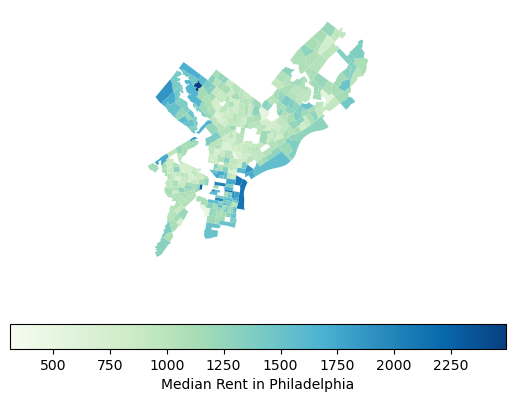

In [80]:
ax2 = pa_housing.plot(column='Median Gross Rent in Renter-occupied housing units paying cash rent',
                   legend=True,
  legend_kwds={'label': "Median Rent in Philadelphia",
                        'orientation': "horizontal"},
               cmap='GnBu');
ax2.set_axis_off()
plt.savefig("philadelphia rent value map.pdf", transparent=True)

In [81]:
m = folium.Map(location=[+40.02, -75.14], 
               zoom_start = 10,
               tiles='CartoDB positron', 
               attribution='CartoDB')

folium.Choropleth(
                  geo_data=pa_housing, # geo data
                  data=pa_housing, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Median Gross Rent in Renter-occupied housing units paying cash rent'], # [key, value]
                  fill_color='GnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Rents in Philadelphia (2021)').add_to(m)    # name on the legend color bar
m

In looking at the distribution, the highest rents are again in the northwest corner and along downtown. The rents along Christopher Columbus Boulevard on the Delaware River were high. Similar to the home values, rents in Center City, Rittenhouse Square, and Society Hall had the census tracts with the highest median rents. 


### Affordable Housing Units

Now I want to explore specific sites of affordable housing investment. I am going to read in a dataset of affordable housing developments that were funded by Division of Housing and Community Development (DHCD) and built between 1994 to August 2019. In looking at the file, there were no geographic variables. However, there are addresses that could be geocoded to be mapped. There are also no city, state, or zip code fields, so in Excel I added a variable for City and State and added Philadelphia and PA because these are all afforable housing units in Philadelphia. 

In [84]:
df4 = pd.read_csv('data/ahedit.csv')

In [85]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OBJECTID              401 non-null    int64  
 1   FISCAL_YEAR_COMPLETE  397 non-null    float64
 2   PROJECT_NAME          401 non-null    object 
 3   DEVELOPER_NAME        401 non-null    object 
 4   ADDRESS               401 non-null    object 
 5   CITY                  401 non-null    object 
 6   STATE                 401 non-null    object 
 7   PROJECT_TYPE          401 non-null    object 
 8   TOTAL_UNITS           398 non-null    float64
 9   ACCESSIBLE_UNITS      28 non-null     float64
 10  SENSORY_UNITS         24 non-null     float64
 11  VISITABLE_UNITS       21 non-null     float64
dtypes: float64(5), int64(1), object(6)
memory usage: 37.7+ KB


Now that it looks like these addresses are a little more complete, I will likely need to concatenate these variables together to make on address variable for the lat and long geocode. I am going to import several libraries that can help me convert address data into lats and longs to map (thanks for the code @chris!)

In [86]:
import geopy
dir(geopy)
from geopy.geocoders import Photon
dir(Photon)
from geopy.geocoders import Nominatim
import time
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from geopy import distance
import osmnx as ox
import contextily as ctx

I also found code that will allow me to identify my specific (non-geocoded) column and run a geocode function to produce a lat, long to then map.

However, I need to make a new more complete address variable. When I initially tried this, I got a map of projects all over the world because of multiple places with the same street address. So, I am going to concatenate this different fields together to get a new variable.

In [87]:
df4['ADDRESS2'] = df4['ADDRESS'] + ' ' + df4['CITY'] + ' ' + df4['STATE']

In [88]:
df4['ADDRESS2'].sample()

55    1515 FAIRMOUNT AVE PHILADELPHIA PA
Name: ADDRESS2, dtype: object

IT LOOKS LIKE IT WORKED!!!!

Now time to geocode these more complete addresses using ['ADDRESS2']

In [89]:
for index, row in df4.iterrows():

    # identify the address column
    address = row['ADDRESS2']
    
    try:
        
        # geocode it
        geocoded_address = ox.geocoder.geocode(address)

        # add it to the dataframe
        df4.at[index,'lat']=geocoded_address[0]
        df4.at[index,'lon']=geocoded_address[1]

        # print the output
        print(address + ' geocoded to ' + str(geocoded_address[0])+' '+str(geocoded_address[1]))        

    except:
        print('Could not geocode '+ address)
        pass

1315 N 8TH ST PHILADELPHIA PA geocoded to 39.972245 -75.14947471428572
3921-61 N 5TH ST PHILADELPHIA PA geocoded to 39.9614883 -75.1465345
3232 HENRY AVE PHILADELPHIA PA geocoded to 40.01024132653061 -75.1810400612245
161-71 W ALLEGHENY AVE PHILADELPHIA PA geocoded to 40.0028681 -75.1627782
447 CANTRELL ST PHILADELPHIA PA geocoded to 39.92200279591837 -75.15428936734693
2000 S 58TH ST PHILADELPHIA PA geocoded to 39.934514 -75.227223
2011-25 N MARSHALL ST PHILADELPHIA PA geocoded to 40.01853 -75.137593
2601 N BROAD ST PHILADELPHIA PA geocoded to 39.99246 -75.154817
1701 S 28TH ST PHILADELPHIA PA geocoded to 39.9316908 -75.19026365765035
1702 N 52nd St PHILADELPHIA PA geocoded to 39.98063232653061 -75.2247380612245
2413-29 N BROAD ST PHILADELPHIA PA geocoded to 40.0336697 -75.1458664
1822-26 W TIOGA ST PHILADELPHIA PA geocoded to 40.006389 -75.153547
3202 MANTUA AVE PHILADELPHIA PA geocoded to 39.96590999853028 -75.18920518697685
1900 W ALLEGHENY AVE PHILADELPHIA PA geocoded to 40.002532

To check my geocoding, I look at the new dataframe. I see that lat and lon are new variables for latitute and longitude. It looks like there were 359 addresses that mapped, so this will be another point to look into, how to clean up address data! 

In [90]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   OBJECTID              401 non-null    int64  
 1   FISCAL_YEAR_COMPLETE  397 non-null    float64
 2   PROJECT_NAME          401 non-null    object 
 3   DEVELOPER_NAME        401 non-null    object 
 4   ADDRESS               401 non-null    object 
 5   PROJECT_TYPE          401 non-null    object 
 6   TOTAL_UNITS           398 non-null    float64
 7   ACCESSIBLE_UNITS      28 non-null     float64
 8   SENSORY_UNITS         24 non-null     float64
 9   VISITABLE_UNITS       21 non-null     float64
dtypes: float64(5), int64(1), object(4)
memory usage: 31.5+ KB


Now that 359 projects from the Philadelphia database have geographic coordinates, I am going to try to generate a map showing the projects' distributions across Philadelphia. It is nice that the variable type is already float, so I won't need to convert that. 

However, the next step will be to convert the dataframe to a geodataframe to map! 

In [91]:
gdf4 = gpd.GeoDataFrame(df4, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df4.lon, df4.lat))

In [92]:
gdf4.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 401 entries, 0 to 400
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              401 non-null    int64   
 1   FISCAL_YEAR_COMPLETE  397 non-null    float64 
 2   PROJECT_NAME          401 non-null    object  
 3   DEVELOPER_NAME        401 non-null    object  
 4   ADDRESS               401 non-null    object  
 5   CITY                  401 non-null    object  
 6   STATE                 401 non-null    object  
 7   PROJECT_TYPE          401 non-null    object  
 8   TOTAL_UNITS           398 non-null    float64 
 9   ACCESSIBLE_UNITS      28 non-null     float64 
 10  SENSORY_UNITS         24 non-null     float64 
 11  VISITABLE_UNITS       21 non-null     float64 
 12  ADDRESS2              401 non-null    object  
 13  lat                   325 non-null    float64 
 14  lon                   325 non-null    float64 
 15

Now that these points are mapped, I am going to use code to place the points on an initial map. 

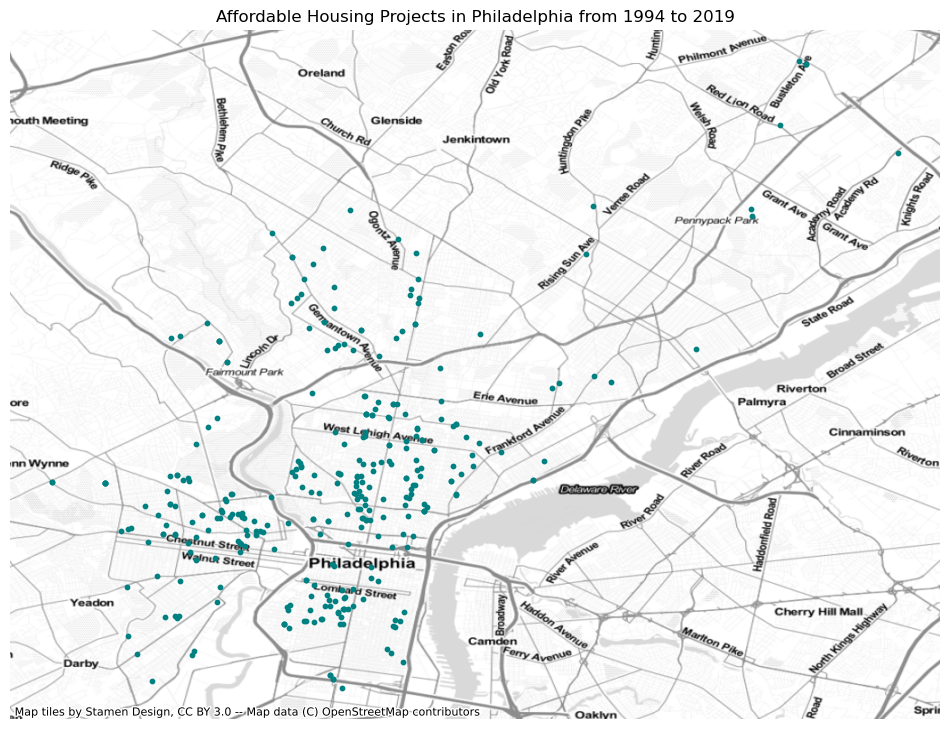

In [93]:
fig, ax = plt.subplots(figsize=(12,12))

# add the data options
gdf4.plot(ax=ax, 
        marker='o',
        markersize=10,
        color='teal')

# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Affordable Housing Projects in Philadelphia from 1994 to 2019')

# add a basemap
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, crs=4326)
plt.savefig("affordablehousingprojects.pdf", transparent=True)

I also want to explore the projects to find additional details on them, so I am going to map these places on a folium map. I am going back to week 2 to look over the code I had through running! I am going to set up a loop to start mapping my markers for each housing project.

In [95]:
for index, row in gdf4.iterrows():
    print(row.PROJECT_NAME, row.lat, row.lon)

Gloria Casarez Residence (1315 N 8th) 39.972245 -75.14947471428572
Roberto Clemente Homes 39.9614883 -75.1465345
Henry Avenue Senior Campus I 40.01024132653061 -75.1810400612245
Villas Del Caribe 40.0028681 -75.1627782
Cantrell Place 39.92200279591837 -75.15428936734693
Ann Thomas Presbyterian 39.934514 -75.227223
APM Preservation 40.01853 -75.137593
The Lofts at 2601 39.99246 -75.154817
Anthony Wayne III 39.9316908 -75.19026365765035
Centennial Village 39.98063232653061 -75.2247380612245
Ruth Williams House 40.0336697 -75.1458664
Tioga Family 40.006389 -75.153547
Mt. Vernon Manor II 39.96590999853028 -75.18920518697685
NewCourtland at Allegheny II 40.002532 -75.160703
Wynn Senior Residences 39.972644 -75.229026
Orinoka Mills nan nan
Lindley Court 40.03115 -75.150579
Blumberg Apartments I 39.962308 -75.178236
St. Raymond's House 40.07232812244898 -75.1679818367347
Tajdeed 39.982036 -75.22896
NewCourtland at Allegheny 40.002532 -75.160703
Nativity BVM Senior 39.98719728571429 -75.102404

In my first time running these data, I observed "nan" values, so there is an empty cell. Because of the data quality, these will need to be dropped for now. However, in the future, I would want to investigate these places because they could be helpful for our project! 

Below, I drop rows that do not have values and create a new dataset.

In [96]:
gdf5=gdf4.dropna(subset=['lon'])

gdf5=gdf4.dropna(subset=['lat'])

To see the outcome, I am going to look at how many remaining observations are in the dataset. 

In [97]:
gdf5.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 325 entries, 0 to 400
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   OBJECTID              325 non-null    int64   
 1   FISCAL_YEAR_COMPLETE  321 non-null    float64 
 2   PROJECT_NAME          325 non-null    object  
 3   DEVELOPER_NAME        325 non-null    object  
 4   ADDRESS               325 non-null    object  
 5   CITY                  325 non-null    object  
 6   STATE                 325 non-null    object  
 7   PROJECT_TYPE          325 non-null    object  
 8   TOTAL_UNITS           323 non-null    float64 
 9   ACCESSIBLE_UNITS      26 non-null     float64 
 10  SENSORY_UNITS         22 non-null     float64 
 11  VISITABLE_UNITS       21 non-null     float64 
 12  ADDRESS2              325 non-null    object  
 13  lat                   325 non-null    float64 
 14  lon                   325 non-null    float64 
 15

Yep! Now only 325, down from 401. That's a really large number of projects. So, again, I will want to do some data cleaning and ask about best practices.

In [98]:
m = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 11,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')


folium.Choropleth(
                  geo_data=pa_housing, # geo data
                  data=pa_housing, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Median Gross Rent in Renter-occupied housing units paying cash rent'], # [key, value]
                  fill_color='GnBu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Rents in Philadelphia (2021)').add_to(m)    # name on the legend color bar
m

In [165]:
for index, row in gdf5.iterrows():
    # add folium marker code
    folium.CircleMarker([row.lat, row.lon], popup=row.PROJECT_NAME,color='darkgreen',fill_color='darkgreen',radius=3,weight=1).add_to(m)

m

c= folium.Choropleth(
                  geo_data=logan_geo, # geo data
                  data=logan_geo, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'Median Gross Rent in Renter-occupied housing units paying cash rent'], # [key, value]
                  fill_color='GnBu',
                  line_weight=0.9, 
                  fill_opacity=0.0,
                  line_opacity=0.9)

for key in c:
    if key.startswith('color_map'):
        del(c.[key])

c.add_to(m)    # name on the legend color bar
m

for key in c._children:
    if key.startswith('color_map'):
        del(c._children[key])
        
c.add_to(m)

In [104]:
logan_geo.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 6 entries, 100 to 337
Data columns (total 41 columns):
 #   Column                                                                          Non-Null Count  Dtype   
---  ------                                                                          --------------  -----   
 0   TRACTCE10                                                                       6 non-null      object  
 1   geometry                                                                        6 non-null      geometry
 2   FIPS                                                                            6 non-null      object  
 3   Households                                                                      6 non-null      int64   
 4   Family Households                                                               6 non-null      int64   
 5   Married-Couple Family                                                           6 non-null      int64   
 6   Ot

m1 = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 11,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')


folium.Choropleth(
                  geo_data=logan_geo, # geo data
                  data=logan_geo, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', ''], # [key, value]
                  fill_color='GnBu',
                  line_weight=3, 
                  fill_opacity=0.0,
                  line_opacity=0.9).add_to(m1)    # name on the legend color bar
m1

In looking at the map above, it seems there are about five affordable housing projects within or in the immediate vicinity of the Logan neighborhood. They are:

* APM Preservation
* Winghocking Street
* Belfield Avenue Townhomes
* Lindley Court
* Shelton Court

I noticed that projects are concentrated near the downtown and immediate neighborhoods. There are very few if any projects in the northwest, where some of the home values were highest. In running this map a second time, I can see that the areas with the highest rents also tend to lack affordable housing projects.

To view this in Github: https://nbviewer.org/github/oarenaucla/phillygis/blob/main/Group%20Assignments/housingdata/philly_census_wk4.ipynb

Now, I want to get some sense of what these projects are. One additional detail to help contextualize these investments. I am going to make a quick bar chart of what types of housing projects these are. My initial exploration is just to count the specific types of data.

In [107]:
affhousing.value_counts('PROJECT_TYPE')

PROJECT_TYPE
Rental           176
Special Needs    116
Homeownership    109
dtype: int64

I am now making a variable for these specific counts to use in a bar chart for comparison.

In [108]:
project_count = affhousing['PROJECT_TYPE'].value_counts()
project_count

Rental           176
Special Needs    116
Homeownership    109
Name: PROJECT_TYPE, dtype: int64

Now, to plot these types, I am going to use the plot.bar function to show the distribution across the three types of projects. 

<AxesSubplot: title={'center': 'Types of Affordable Housing Projects'}>

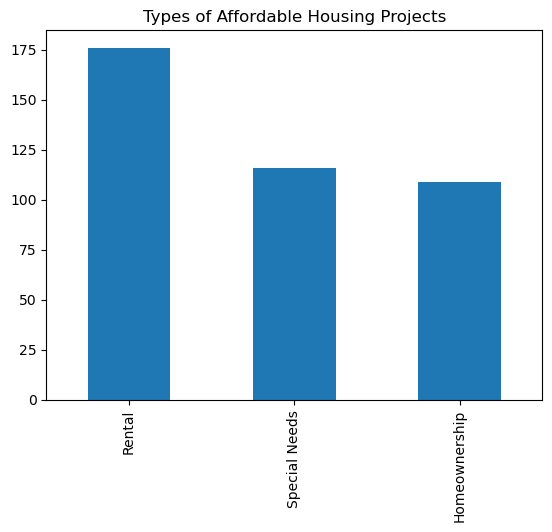

In [110]:
project_count.plot.bar(x = 'PROJECT_TYPE', y = 'project_count', title = 'Types of Affordable Housing Projects')


Now time to make it more consistent with our theme. 

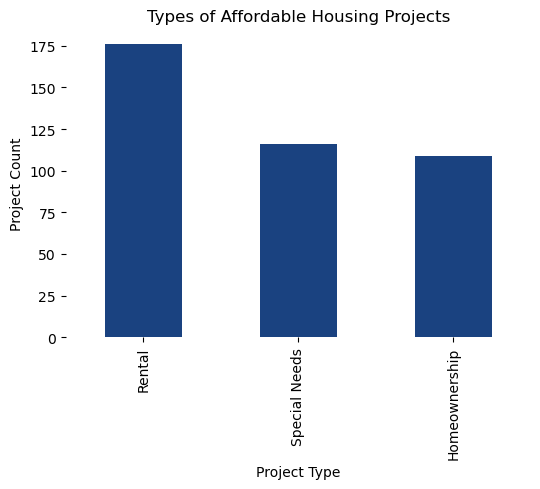

In [143]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)

project_count.plot.bar(ax=ax,
                                      x='PROJECT_TYPE',
                                      y='project_count',
                                      legend=False,
                                      color='#1a4280ff'
                                      )
ax.set_xlabel('Project Type') # override x label
ax.set_ylabel('Project Count') # override y label
plt.title("Types of Affordable Housing Projects"); # multi-line title with padding


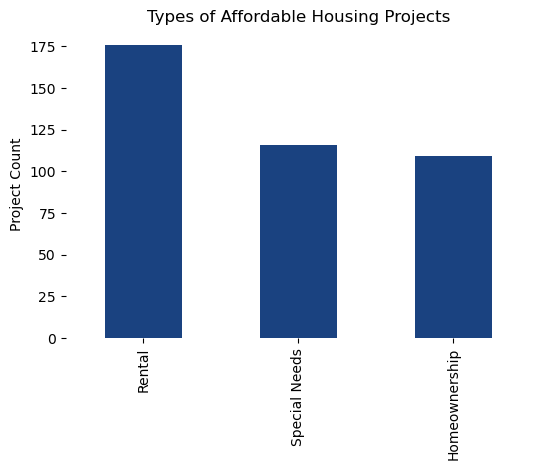

In [161]:
fig, ax = plt.subplots(figsize=(6,4))

for spine in plt.gca().spines.values():
    spine.set_visible(False)

project_count.plot.bar(ax=ax,
                                      x='PROJECT_TYPE',
                                      y='project_count',
                                      legend=False,
                                      color='#1a4280ff',
                                       )
                                      
ax.set_ylabel('Project Count') # override y label
plt.title("Types of Affordable Housing Projects"); # multi-line title with padding

In [188]:
m2 = folium.Map(location=[+39.99, -75.1652], 
               zoom_start = 11,
               tiles='Stamen Toner', 
               attribution='Stamen Toner')

m2
folium.Circle(
    radius=1200,
    location=[+40.03038,-75.14659],
    popup="Logan Neighborhood",
    color="teal",
    fill=False,
).add_to(m2)

m2
